# Data Visualization with Plotly and cufflinks

The [plotly](https://plot.ly/python/) Python package is an open-source library built on [plotly.js](https://plot.ly/javascript/) which in turn is built on d3.js. For better integration with Pandas a wrapper on plotly called cufflinks completes the stack. So, the entire stack is cufflinks > plotly > plotly.js > d3.js. This combines the efficiency of coding in Python with the incredible interactive graphics capabilities of d3.
(Plotly itself is a graphics company with several products and open-source tools. The Python library is free to use, and we can make unlimited charts in offline mode plus up to 25 charts in online mode to share with the world.)


After importing cufflinks, plotly plots can be made using `df.iplot()` and then specifying parameters. This is a great replacement for matplotlib!

Supported plots using cufflinks:
   scatter, bar, box, spread
   ratio, heatmap, surface
   histogram, bubble, bubble3d
   scatter3d, scattergeo, ohlc
   candle, pie, choroplet
   
   
A good overview over the complete python data visualization ecosystem can be found here: [PyViz: Simplifying the Data Visualisation process in Python](https://towardsdatascience.com/pyviz-simplifying-the-data-visualisation-process-in-python-1b6d2cb728f1), [PyViz](http://pyviz.org) is a collaboration between the maintainers of several packages, including Bokeh , HoloViews , GeoViews , hvPlot , Datashader , Param , and Panel.


## Installation
https://github.com/plotly/plotly.py

recommended packages:

```
conda install python-snappy
conda install datashader
```

Sources: 

* [Analysis of medium](https://github.com/WillKoehrsen/Data-Analysis/tree/master/medium)
* [Cufflinks](https://github.com/santosjorge/cufflinks), [Examples by Will Koehrsen](https://towardsdatascience.com/the-next-level-of-data-visualization-in-python-dd6e99039d5e)
* [APACHE Parquet columnar storage format](https://arrow.apache.org/docs/python/parquet.html)
* Py Viz Framework overviews: [Python visualization landscape](https://speakerdeck.com/jakevdp/pythons-visualization-landscape-pycon-2017?slide=36), [Framework Evaluation](https://www.fusioncharts.com/blog/best-python-data-visualization-libraries/)
* [SciPy Viz Abstract](http://conference.scipy.org/proceedings/scipy2018/pdfs/jon_mease.pdf)
* [Dash for analytical web appilcations](https://github.com/plotly/dash)

In [2]:
# plotly standard imports
import plotly.graph_objs as go
import plotly.plotly as py

# Data science imports
import pandas as pd
import numpy as np

# Options for pandas
pd.options.display.max_columns = 30

# datashader
import datashader as ds
import datashader.transfer_functions as tf
from datashader.colors import inferno
# scikit learn
from sklearn import datasets


## Jupyter widget support

Plotly 3.0.0 introduces a new Jupyter widget class: `plotly.graph_objs.FigureWidget`. **FigureWidget** has the same call signature as existing Figure, and it’s made specifically for Jupyter Notebook and JupyterLab environments.

You can print the figure just like every other object in Jupyter. `plotly.offline.init_notebook_mode` and `plotly.offline.iplot` are no longer necessary.
The **FigureWidget** is synced up with the plotly.js JavaScript figure object, so you can access all of the properties of the figure, including the dynamic default properties that were previously only available in the JavaScript context.

plotly.js graphs are declarative. You describe what the graph should look like, not how to draw it. This means that every aspect of the charts (the colors of the bars, the axes grid lines, the position of annotations) are completely described through a set of attributes. This set of attributes is the “Plotly JSON Chart Schema,” and it describes every aspect of over 33 chart types.

plotly 3.0.0 introduces a set of imperative methods for manipulating and exploring the figure in Jupyter’s interactive computing environments. It’s easier than ever to traverse the figure structure and manipulate the graph. The imperative methods are one-to-one with the declarative attributes, so it’s easy to switch between describing your graph entirely upfront (declarative method) and editing it on-the-fly in Jupyter (imperative method).

Performance:

* plotly.py figure specifications are now serialized and transferred to plotly.js using the Widget Message Protocol over the Jupyter Comms infrastructure.
* Thanks to the great work of the ipywidgets team, Python numpy arrays are now transferred into JavaScript TypedArrays without any intermediate UTF-8 encoding. We’d especially like to thank Maarten Breddels, Sylvain Corlay, and Jason Grout for laying very thoughtful foundations for this. We’re standing on the shoulders of giants!
* plotly.js provides direct support for TypedArrays (added in v0.35.0) and it provides a super fast WebGL pathway for many trace types.

In [3]:
no_points = 1000
x = np.random.randn(no_points)
y = np.random.randn(no_points)

go.FigureWidget(data=[{'x' : x, 'y': y, 'type': 'histogram2dcontour'}])

FigureWidget({
    'data': [{'type': 'histogram2dcontour',
              'uid': '6e95c243-9044-4301-9e51-2ed0d…

In [41]:
# plot 1 Mio data points
N = no_points**2
x = np.random.randn(N)
y = np.random.randn(N)
go.FigureWidget(data=[go.Scattergl(x=x, y=y, mode='markers')])

FigureWidget({
    'data': [{'mode': 'markers',
              'type': 'scattergl',
              'uid': '1efc3…

## Context manager for animations


In [4]:
from ipywidgets import IntSlider
slider = IntSlider(value=0, min=1, max=10, step=1, layout=dict(width='100%'))
def animate_figure(change):
    with fig.batch_animate(duration=500):
        trace.y = np.sin(x) * change['new']

slider.observe(animate_figure, names='value')

## Data shader
Use DataShader to display large datasets inside a plotly FigureWidget. Change callbacks are used to recompute the datashader image whenever the axis range or figure size changes.

The image genration function inputs an x/y ranges and the plot width/height and generates a DataShader image of the dataset. The image will be returned as a PIL image object.


In [6]:
num_copies = 7000 # 1,050,000 rows

iris_data = datasets.load_iris()
feature_names = [name.replace(' (cm)', '').replace(' ', '_') for name in iris_data.feature_names]
iris_df_orig = pd.DataFrame(iris_data.data, columns=feature_names)
target_orig = iris_data.target + 1

# frame of features
iris_df = pd.concat(
    np.random.normal(scale=0.2, size=iris_df_orig.shape) + iris_df_orig for i in range(num_copies)
).reset_index(drop=True)

# array of targets
target = [t for i in range(num_copies) for t in target_orig]

# dataframe that includes target as categorical
iris_target_df = pd.concat([iris_df, pd.Series(target, name='target', dtype='category')], axis=1)

iris_df.describe()

,sepal_length,sepal_width,petal_length,petal_width
count,1.050000e+06,1.050000e+06,1.050000e+06,1.050000e+06
mean,5.843234e+00,3.057825e+00,3.758318e+00,1.199461e+00
std,8.492519e-01,4.781008e-01,1.770795e+00,7.855289e-01
min,3.531229e+00,1.342825e+00,2.176499e-01,-8.344852e-01
25%,5.155285e+00,2.741761e+00,1.635651e+00,3.942622e-01
50%,5.801820e+00,3.035937e+00,4.306760e+00,1.316066e+00
75%,6.443154e+00,3.354687e+00,5.142684e+00,1.827785e+00
max,8.636093e+00,5.061693e+00,7.664907e+00,3.329091e+00


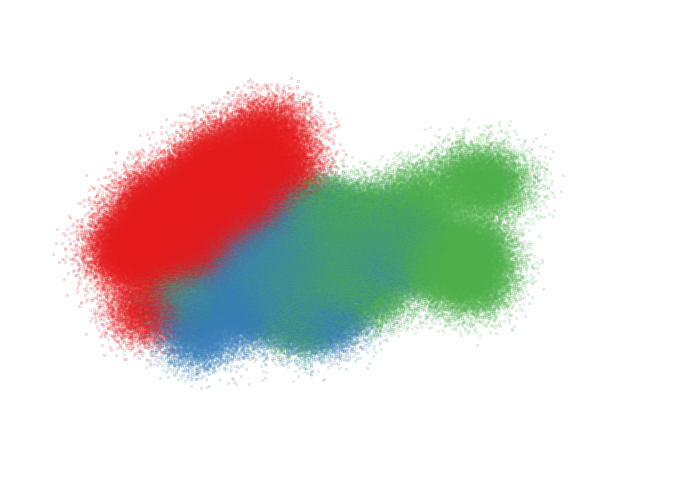

In [7]:
def gen_ds_image(x_range, y_range, plot_width, plot_height):
    if x_range is None or y_range is None or plot_width is None or plot_height is None:
        return None
    
    cvs = ds.Canvas(x_range=x_range, y_range=y_range, plot_height=plot_height, plot_width=plot_width)
    agg_scatter = cvs.points(iris_target_df, 
                         'sepal_length', 'sepal_width', 
                          ds.count_cat('target'))
    img = tf.shade(agg_scatter)
    img = tf.dynspread(img, threshold=0.95, max_px=5, shape='circle')
    
    return img.to_pil()

# intial size
x_range=[3, 10]
y_range=[0, 6]
plot_height=500
plot_width=700

# Test image generation function and display the PIL image
initial_img = gen_ds_image(x_range, y_range, plot_width, plot_height)

initial_img

In [8]:
## FigureWidget with backgound image


In [9]:
f = go.FigureWidget(data=[{'x': x_range, 
                           'y': y_range, 
                           'mode': 'markers',
                           'marker': {'opacity': 0}}], # invisible trace to init axes and to support autoresize
                    layout={'width': plot_width, 'height': plot_height})
f

FigureWidget({
    'data': [{'marker': {'opacity': 0},
              'mode': 'markers',
              'type': …

In [10]:
# Set background image
f.layout.images = [go.layout.Image(
    source = initial_img,  # plotly now performs auto conversion of PIL image to png data URI
    xref = "x",
    yref = "y",
    x = x_range[0],
    y = y_range[1],
    sizex = x_range[1] - x_range[0],
    sizey = y_range[1] - y_range[0],
    sizing = "stretch",
    layer = "below")]

## Image updates on drag zoom¶ with  change callback

In [11]:
# change callback to update image on zoom/resize
def update_ds_image(layout, x_range, y_range, plot_width, plot_height):
    img = f.layout.images[0]
    
    # Update with batch_update so all updates happen simultaneously
    with f.batch_update():
        img.x = x_range[0]
        img.y = y_range[1]
        img.sizex = x_range[1] - x_range[0]
        img.sizey = y_range[1] - y_range[0]
        img.source = gen_ds_image(x_range, y_range, plot_width, plot_height)

# Install callback to run exactly once if one or more of the following properties changes
#  - xaxis range
#  - yaxis range
#  - figure width
#  - figure height
f.layout.on_change(update_ds_image, 'xaxis.range', 'yaxis.range', 'width', 'height')

In [12]:
f.layout.dragmode = 'zoom'
f

FigureWidget({
    'data': [{'marker': {'opacity': 0},
              'mode': 'markers',
              'type': …

### Colorscales in Plotly

In [ ]:
colorscales = [
    'Greys', 'YlGnBu', 'Greens', 'YlOrRd', 'Bluered', 'RdBu', 'Reds', 'Blues',
    'Picnic', 'Rainbow', 'Portland', 'Jet', 'Hot', 'Blackbody', 'Earth',
    'Electric', 'Viridis', 'Cividis'
]


## Plotly + Cufflinks 
Cufflinks is a wrapper around the plotly library specifically for plotting with Pandas dataframes. With cufflinks, we don't have to dig into the details of plotly, instead building our charts with minimal code. Basically, you can make charts directly in plotly for more control, or you can use cufflinks to rapidly prototype plots and explore the data.

In [6]:
# Cufflinks wrapper on plotly
# Set global theme
import cufflinks
cufflinks.set_config_file(world_readable=True, theme='pearl')
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'
from plotly.offline import iplot
cufflinks.go_offline() #go offline

# Set global theme
cufflinks.set_config_file(world_readable=True, theme='pearl')

def to_time(dt):
    return dt.hour + dt.minute / 60

df = pd.read_parquet('data/medium_data_2019_01_06.dms') # data in APACHE parquet format
#df.head()

In [50]:
# themes
themes = cufflinks.themes.THEMES.keys()
themes

dict_keys(['ggplot', 'pearl', 'solar', 'space', 'white', 'polar', 'henanigans'])

In [48]:
# colors
cufflinks.colors.scales()

### Chart Studio
Editing in Plotly Chart Studio
When you make these plots in the notebook, you’ll notice a small link on the lower right-hand side on the graph that says *“Export to plot.ly”*. If you click that link, you are then taken to the [chart studio](https://plot.ly/create/#/) where you can touch up your plot for a final presentation. You can add annotations, specify the colors, and generally clean everything up for a great figure. Then, you can publish your figure online so anyone can find it with the link.

### Histograms
Single variable — univariate — plots are a standard way to start an analysis. Only one line of code to produce one.

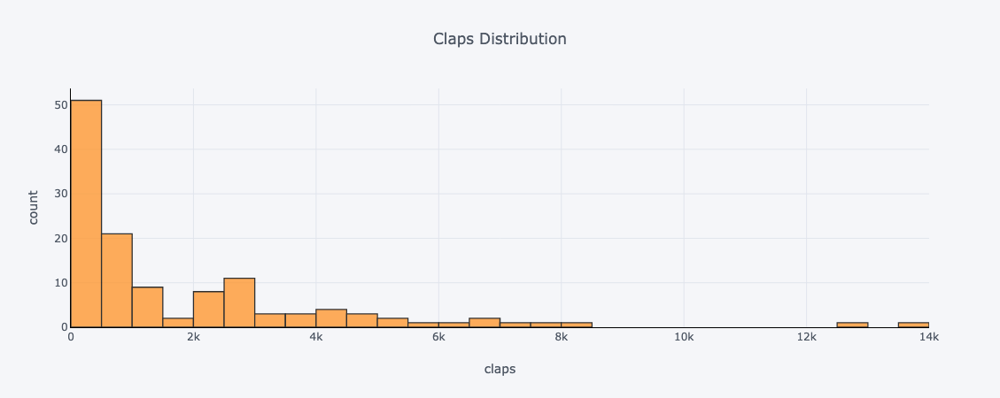

In [4]:
df['claps'].iplot(
    kind='hist',
    bins=30,
    xTitle='claps',
    linecolor='black',
    yTitle='count',
    title='Claps Distribution')

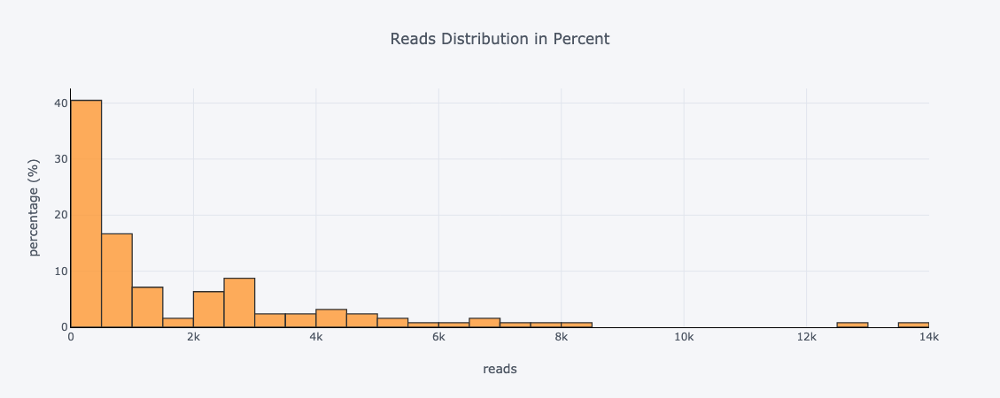

In [7]:
# same normed by percent
df['claps'].iplot(
    kind='hist',
    bins=30,
    xTitle='reads',
    linecolor='black',
    histnorm='percent',
    yTitle='percentage (%)',
    title='Reads Distribution in Percent')

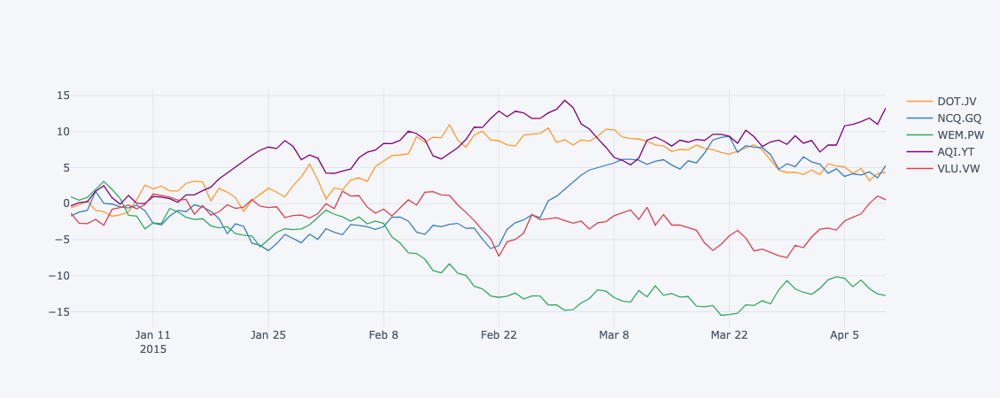

In [60]:
df = cufflinks.datagen.lines()
df.iplot(kind='scatter', filename='cufflinks/cf-simple-line')

#### Grouped Histograms
When we want to display two different distributions on the same plot, we can group together the data to show it side-by-side. This means setting barmode to group with two distributions.

In [ ]:
df['time_started'] = df['started_date'].apply(to_time)
df['time_published'] = df['published_date'].apply(to_time)

df[['time_started', 'time_published']].iplot(
    kind='hist',
    linecolor='black',
    bins=24,
    histnorm='percent',
    bargap=0.1,
    opacity=0.8,
    barmode='group',
    xTitle='Time of Day',
    yTitle='(%) of Articles',
    title='Time Started and Time Published')

#### Overlaied Histograms

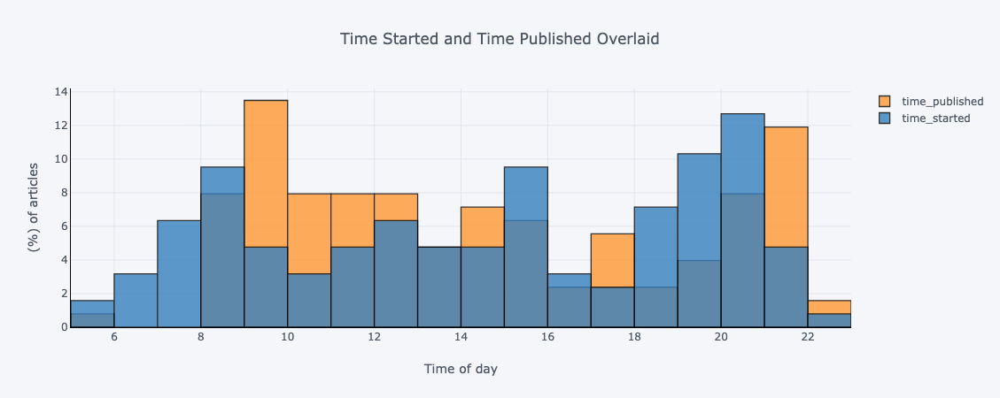

In [10]:
df[['time_published', 'time_started']].iplot(
    kind='hist',
    bins=24,
    linecolor='black',
    opacity=0.8,
    histnorm='percent',
    barmode='overlay',
    xTitle='Time of day',
    yTitle='(%) of articles',
    title='Time Started and Time Published Overlaid')

### Bar Plot
For a bar plot, we need to apply some sort of aggregation function and then plot. For example, we can show the count of articles in each publication with the following.

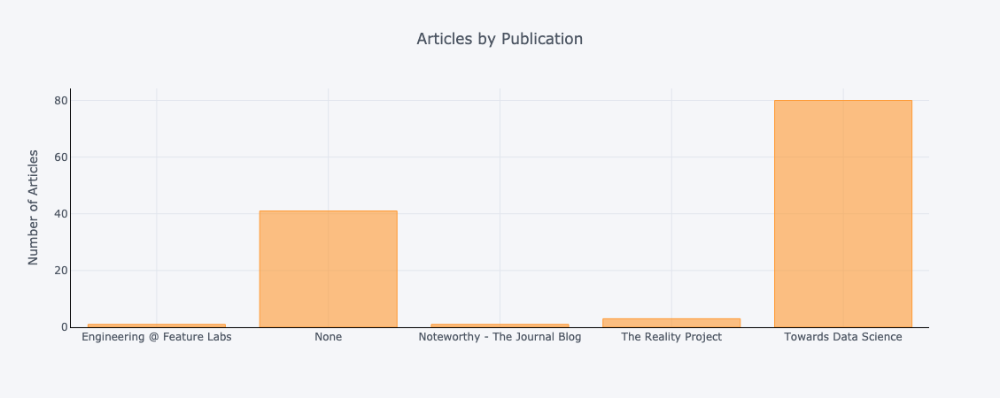

In [11]:
df.groupby('publication').count()['fans'].iplot(
    kind='bar', yTitle='Number of Articles', linecolor='black', title='Articles by Publication')

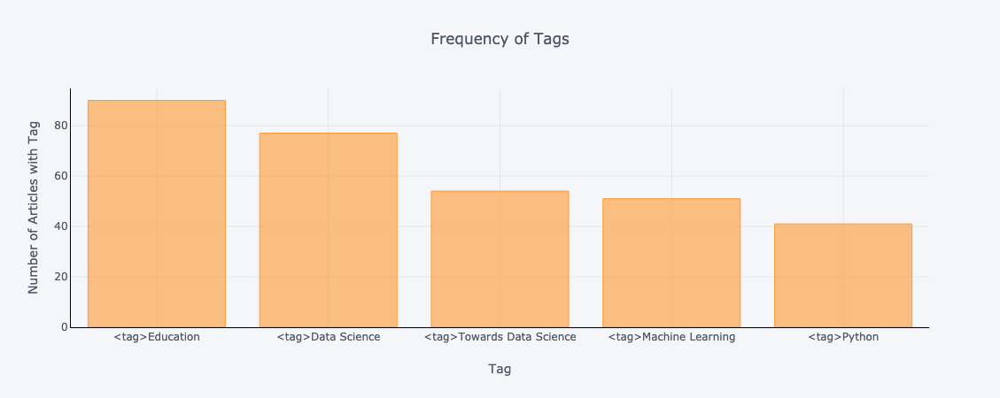

In [12]:
df[[c for c in df if '<tag>' in c]].sum().iplot(
    kind='bar',
    xTitle='Tag',
    yTitle='Number of Articles with Tag',
    title='Frequency of Tags',
    linecolor='black',
    sortbars=True)

#### Bar Plot with Two Categories
Here we'll show two distributions side-by-side. First, we'll set the index to be the date, then resample to month frequency, then take the mean and plot.

By hovering over any month on the graph, we can make direct comparisons. This is a very handy way to explore your data!

In [13]:
df2 = df[['views', 'reads',
          'published_date']].set_index('published_date').resample('M').mean()
df2.head()

,views,reads
published_date,,
2017-06-30,463.666667,112.333333
2017-07-31,5521.333333,1207.166667
2017-08-31,6242.800000,993.700000
2017-09-30,2113.000000,279.000000
2017-10-31,NaN,NaN


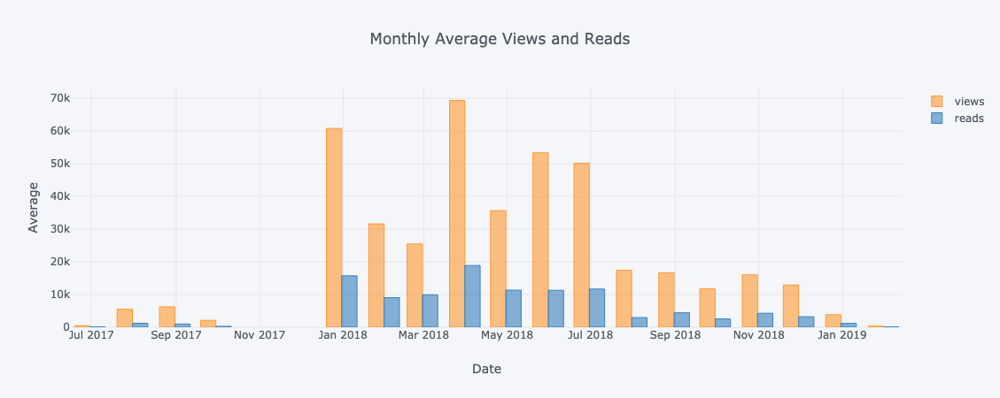

In [14]:
df2.iplot(
    kind='bar',
    xTitle='Date',
    yTitle='Average',
    title='Monthly Average Views and Reads')

#### Bar Plot with Second Y-Axis
If we want to put two very different ranges on the same graph, we can just use a secondary y-axis.

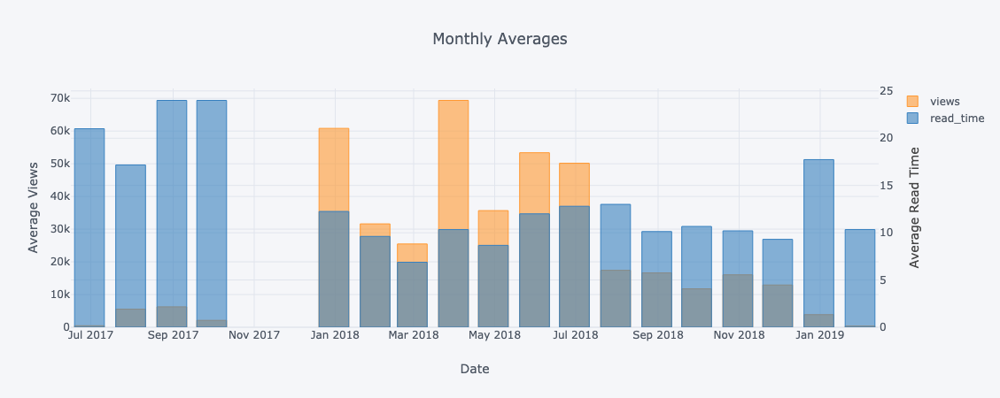

In [15]:
df2 = df[['views', 'read_time',
          'published_date']].set_index('published_date').resample('M').mean()

df2.iplot(
    kind='bar',
    xTitle='Date',
    secondary_y='read_time',
    secondary_y_title='Average Read Time',
    yTitle='Average Views',
    title='Monthly Averages')

### Boxplot

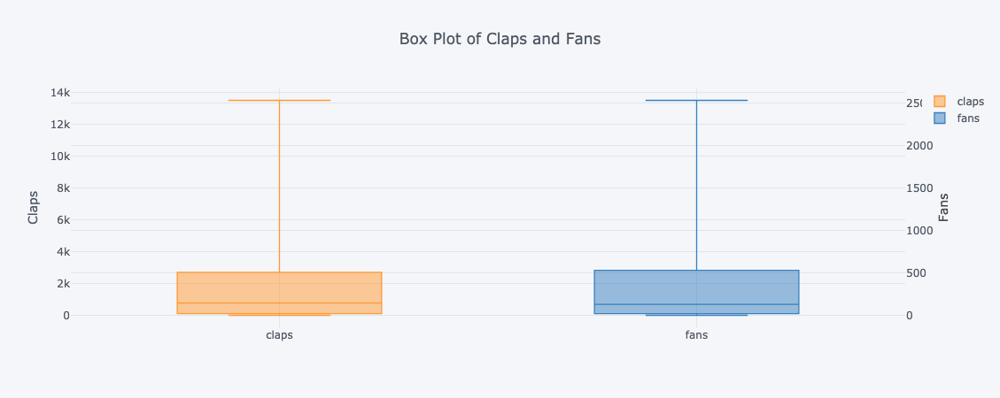

In [16]:
df[['claps', 'fans']].iplot(secondary_y='fans', secondary_y_title='Fans',
    kind='box', yTitle='Claps', title='Box Plot of Claps and Fans')

#### Boxplot with Different Categories
If we have different categories that we want to plot, we need to use a pivot. This transforms each unique value in a column into a separate column.

Here we are also explicitly specifying the layout as a dictionary. This gives us more control over different aspects of the plot such as the margin (like the border of the image).

In [17]:
df2 = df.pivot(
    columns='publication', values='fans')
df2.head()

publication,Engineering @ Feature Labs,None,Noteworthy - The Journal Blog,The Reality Project,Towards Data Science
0,NaN,NaN,NaN,34.0,NaN
1,NaN,NaN,NaN,29.0,NaN
2,NaN,NaN,NaN,13.0,NaN
3,NaN,34.0,NaN,NaN,NaN
4,NaN,47.0,NaN,NaN,NaN


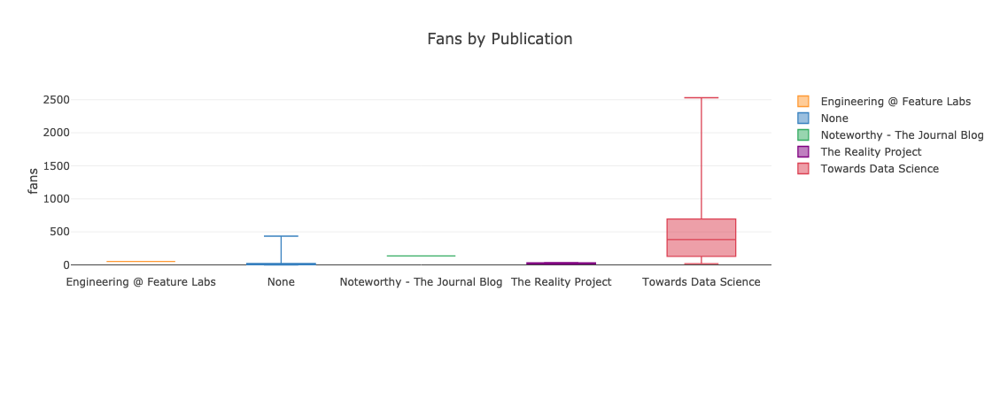

In [18]:
df2.iplot(
        kind='box',
        layout=dict(
            height=600,
            yaxis=dict(title='fans'),
            title='Fans by Publication',
            margin=dict(b=140)))

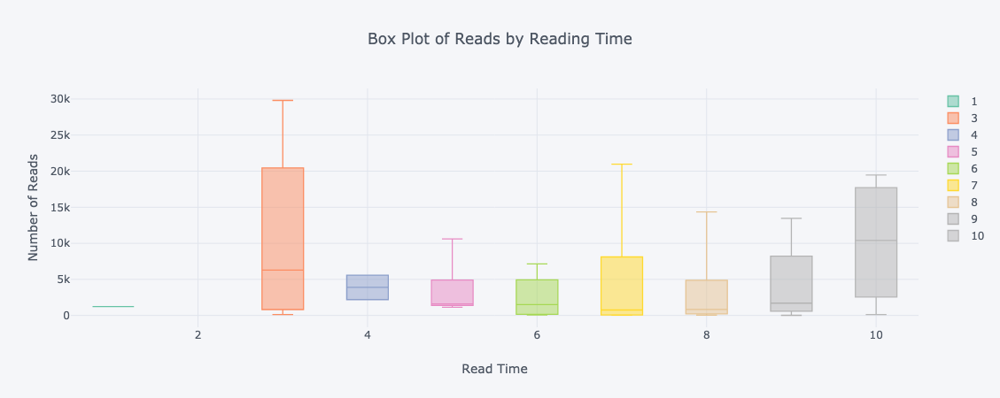

In [19]:
df[df['read_time'] <= 10].pivot(
    columns='read_time', values='reads').iplot(
        kind='box', colorscale='set2',
        xTitle='Read Time',
        yTitle='Number of Reads',
        title='Box Plot of Reads by Reading Time')

### Scatter Plots
The scatter plot is a simple yet effective method for visualizing the relationship between two variables. There are many ways we can make scatterplots in plotly + cufflinks.

#### Time-Series
A considerable portion of real-world data has a time element. Luckily, plotly + cufflinks was designed with time-series visualizations in mind. Let’s make a dataframe of my TDS articles and look at how the trends have changed.

It's very simple to make time-series plots if we set the index to be the datetime. Then we can simply pass in a column as y and plotly will know to use the index to make a date xaxis.

In [20]:
tds = df[df['publication'] == 'Towards Data Science'].set_index(
    'published_date')

tds.head()

,claps,days_since_publication,fans,link,num_responses,publication,read_ratio,read_time,reads,started_date,tags,text,title,title_word_count,type,views,word_count,claps_per_word,editing_days,<tag>Education,<tag>Data Science,<tag>Towards Data Science,<tag>Machine Learning,<tag>Python,time_started,time_published
published_date,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-12-27 11:20:00,4800,374.986885,861,https://towardsdatascience.com/random-forest-i...,27,Towards Data Science,17.68,21,28566,2017-12-26 15:11:00,"[Machine Learning, Data Science, Random Forest...",Random Forest in Python A Practical End-to-End...,Random Forest in Python,4,published,161596,4494,1.068091,0,0,1,0,1,1,15.183333,11.333333
2018-01-06 20:15:00,857,364.615092,112,https://towardsdatascience.com/improving-rando...,6,Towards Data Science,22.76,17,7207,2018-01-03 21:38:00,"[Machine Learning, Python, Data Science, Learn...",Improving the Random Forest in Python Part 1 G...,Improving the Random Forest in Python Part 1,8,published,31659,3504,0.244578,2,0,1,0,1,1,21.633333,20.250000
2018-01-07 20:37:00,186,363.599979,45,https://towardsdatascience.com/data-science-a-...,1,Towards Data Science,28.64,15,775,2018-01-07 13:18:00,"[Data Science, Data, Weight Loss, Programming]",Data Science: A Personal Application Charting ...,Data Science: A Personal Application,5,published,2706,3569,0.052115,0,0,1,0,0,0,13.300000,20.616667
2018-01-08 16:58:00,119,362.752029,43,https://towardsdatascience.com/a-theory-of-pre...,2,Towards Data Science,31.53,11,740,2018-01-02 17:23:00,"[Statistics, Data Science, Book Review, Books]",A Theory of Prediction Review of The Signal an...,A Theory of Prediction,4,published,2347,2817,0.042244,5,0,1,0,0,0,17.383333,16.966667
2018-01-09 21:49:00,2000,361.550093,392,https://towardsdatascience.com/hyperparameter-...,12,Towards Data Science,23.99,12,25505,2018-01-09 12:26:00,"[Machine Learning, Python, Data Science, Data]",Hyperparameter Tuning the Random Forest in Pyt...,Hyperparameter Tuning the Random Forest in Python,7,published,106311,2456,0.814332,0,0,1,0,1,1,12.433333,21.816667


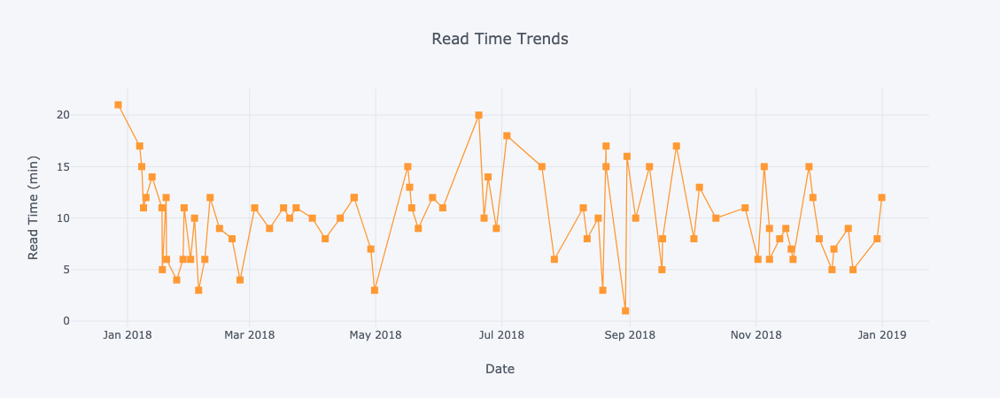

In [21]:
tds['read_time'].iplot(
    mode='lines+markers',
    opacity=0.8,
    size=8,
    symbol=1,
    xTitle='Date',
    yTitle='Read Time (min)',
    title='Read Time Trends')

#### Two Variables Time-Series
For a second variable, we just add it in.

The first is a little hard to compare, so we add the second variable on a secondary y-axis in the second diagram.

DCombine different things in one line:
* Getting a nicely formatted time-series x-axis automatically
* Adding a secondary y-axis because our variables have different ranges
* Adding in the title of the articles as hover information

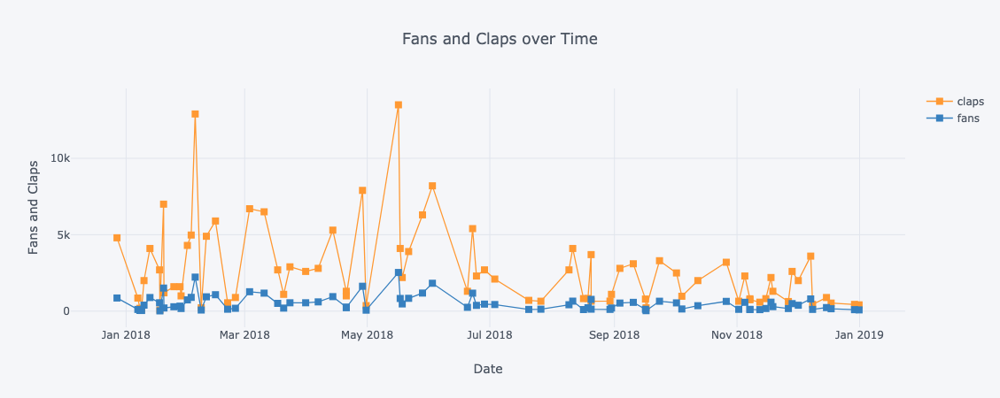

In [22]:
tds[['claps', 'fans']].iplot(
    mode='lines+markers',
    opacity=0.8,
    size=8,
    symbol=1,
    xTitle='Date',
    yTitle='Fans and Claps',
    title='Fans and Claps over Time')

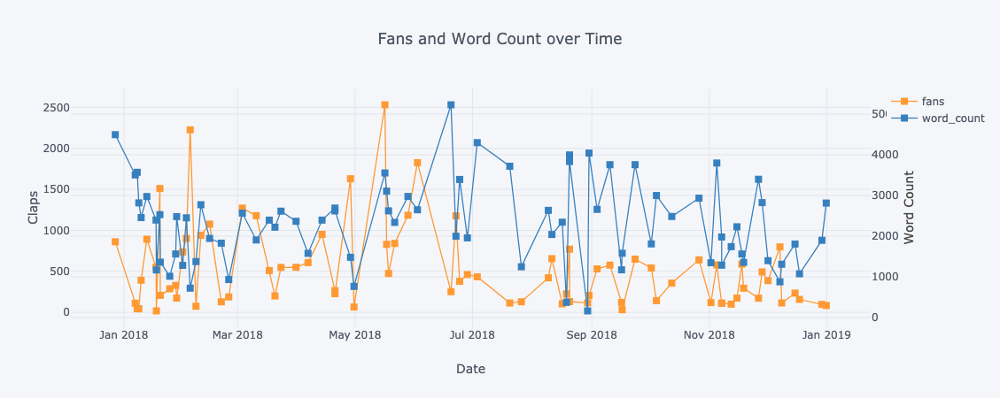

In [23]:
tds[['fans', 'word_count', 'title']].iplot(
    y='fans',
    mode='lines+markers',
    secondary_y = 'word_count',
    secondary_y_title='Word Count',
    opacity=0.8,
    size=8,
    symbol=1,
    xTitle='Date',
    yTitle='Claps',
    text='title',
    title='Fans and Word Count over Time')

#### Text Annotations on Plot
Adding text to plots is pretty simple (just the formatting can be a bit tricky). The text is written in HTML which gives us control over the formatting.

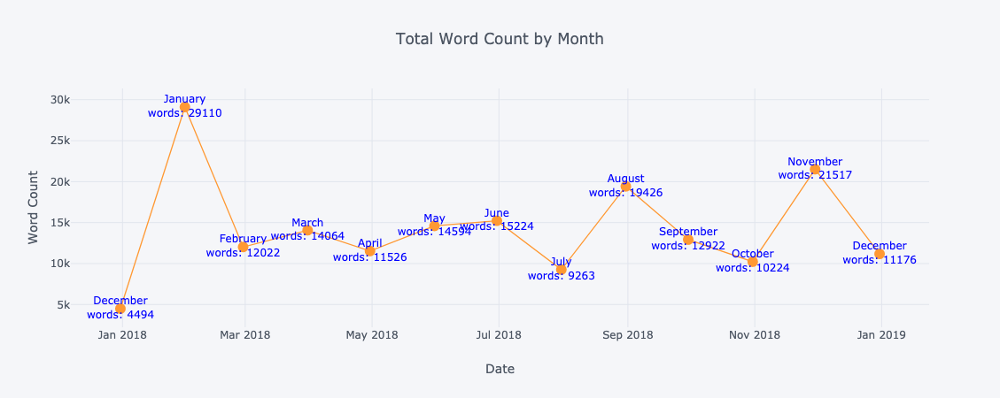

In [24]:
tds_monthly_totals = tds.resample('M').sum()

tds_monthly_totals['text'] = [
    f'<span style="color:blue">{m}<span><br>words: {w:.0f}'
    for m, w in zip(tds_monthly_totals.index.month_name(),
                    tds_monthly_totals['word_count'])
]

tds_monthly_totals.iplot(
    mode='lines+markers+text',
    text='text',
    y='word_count',
    opacity=0.8,
    xTitle='Date',
    yTitle='Word Count',
    title='Total Word Count by Month')

#### Numeric plot

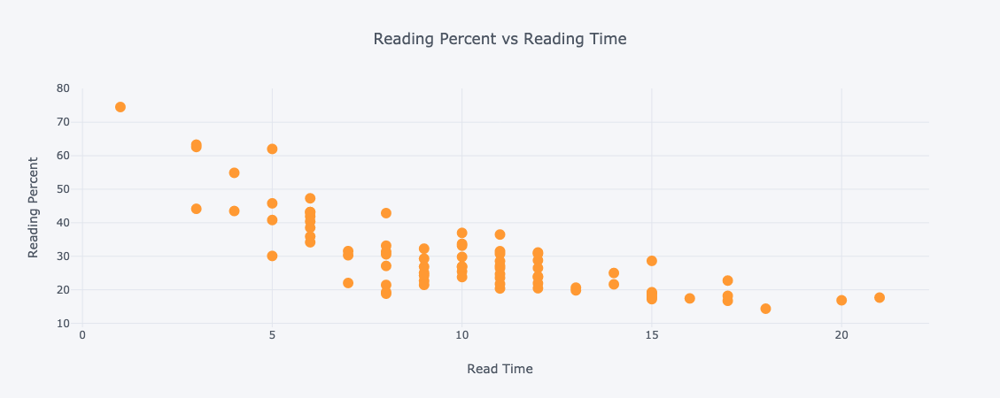

In [25]:

tds.iplot(
    x='read_time',
    y='read_ratio',
    xTitle='Read Time',
    yTitle='Reading Percent',
    text='title',
    mode='markers',
    title='Reading Percent vs Reading Time')


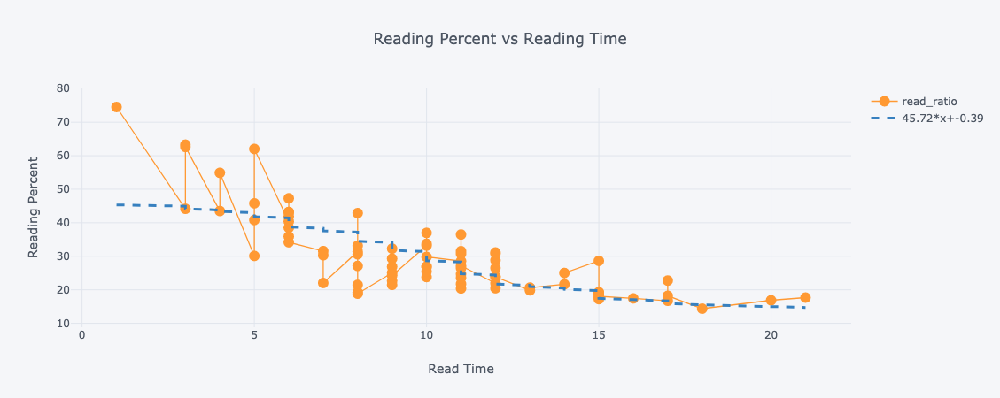

In [27]:
# two numeric variables with best fit line
tds.sort_values('read_time').iplot(
    x='read_time',
    y='read_ratio',
    xTitle='Read Time',
    yTitle='Reading Percent',
    text='title',
    mode='markers+lines',
    bestfit=True, bestfit_colors=['blue'],
    title='Reading Percent vs Reading Time')

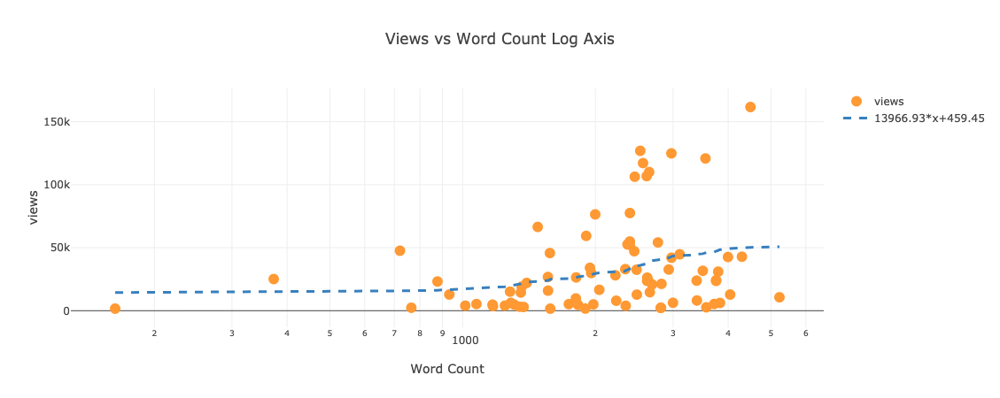

In [29]:
# Log Scale
layout = dict(
    xaxis=dict(type='log', title='Word Count'),
    yaxis=dict(title='views'),
    title='Views vs Word Count Log Axis')

tds.sort_values('word_count').iplot(
    x='word_count',
    y='views',
    layout=layout,
    text='title',
    mode='markers',
    bestfit=True,
    bestfit_colors=['blue'])

#### Scatterplot By Category

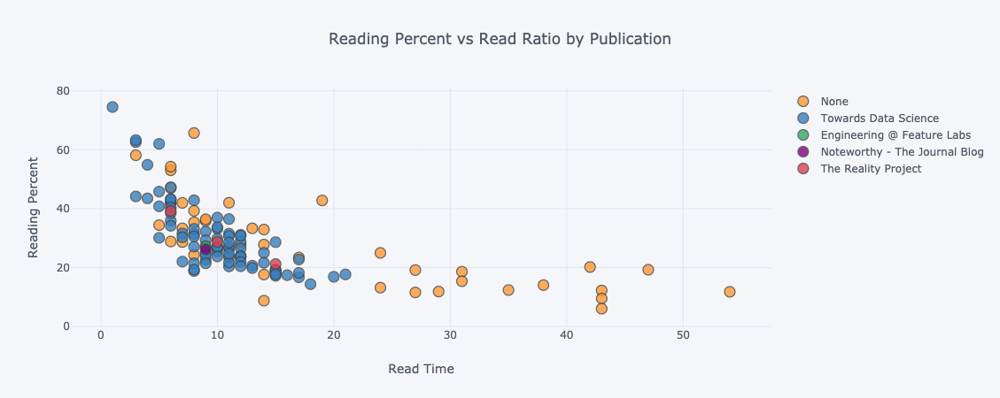

In [30]:
df.iplot(
    x='read_time',
    y='read_ratio',
    categories='publication',
    xTitle='Read Time',
    yTitle='Reading Percent',
    title='Reading Percent vs Read Ratio by Publication')

#### Cumulative Plot
We can make cumulative plots by adding up the statistics over time.

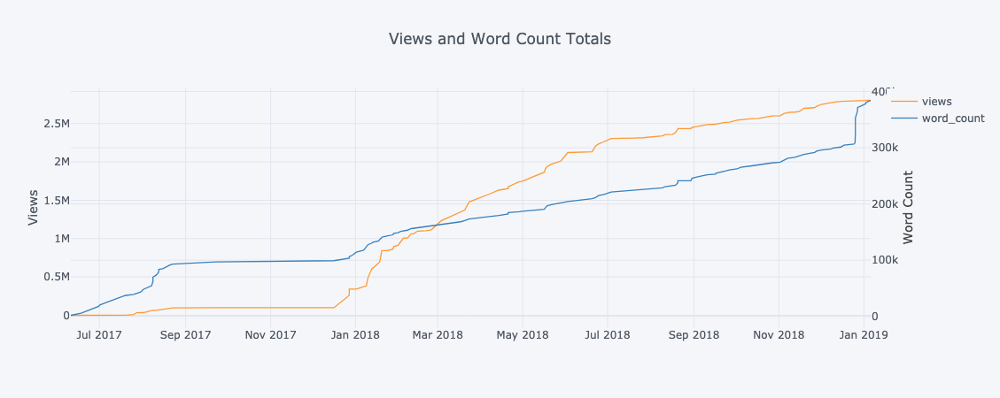

In [31]:
df.set_index('published_date')[['views', 'word_count']].cumsum().iplot(y='views', secondary_y='word_count',
                                                 yTitle='Views', secondary_y_title='Word Count',
                                                 title='Views and Word Count Totals')

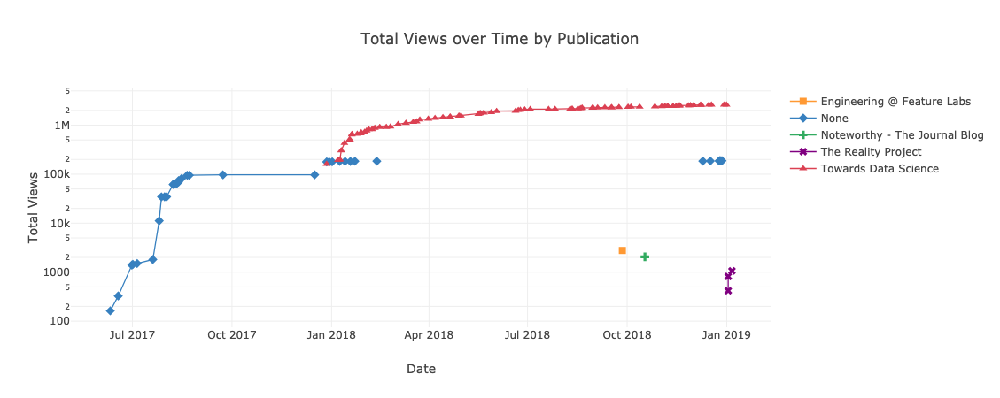

In [33]:
df.pivot_table(
    values='views', index='published_date',
    columns='publication').cumsum().iplot(
        mode='markers+lines',
        size=8,
        symbol=[1, 2, 3, 4, 5],
        layout=dict(
            xaxis=dict(title='Date'),
            yaxis=dict(type='log', title='Total Views'),
            title='Total Views over Time by Publication'))

### More than 2 Variables
We can expand to greater than 2 variables by encoding information in the colors, size of markers, or symbols. We can also use secondary y-axes for more information.

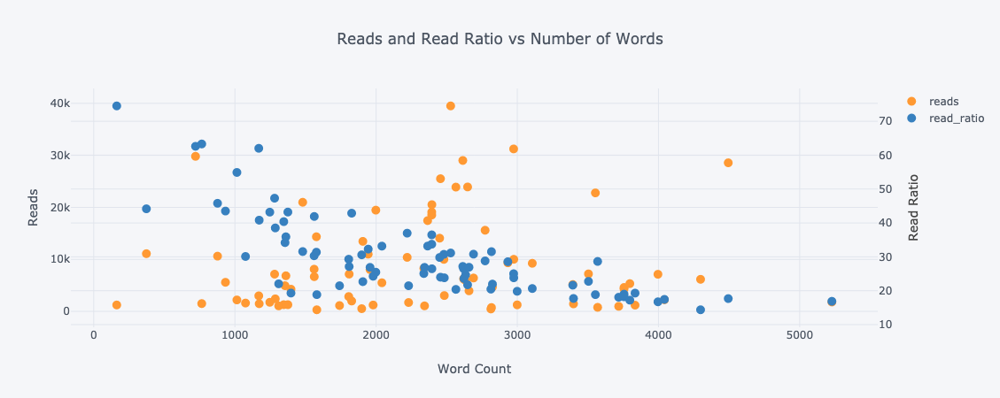

In [35]:
# secondary y axis
tds[['word_count', 'reads', 'read_ratio', 'title']].iplot(
    x='word_count',
    y='reads',
    secondary_y='read_ratio',
    xTitle='Word Count',
    yTitle='Reads',
    secondary_y_title='Read Ratio',
    mode='markers',
    size=10,
    text='title',
    title='Reads and Read Ratio vs Number of Words')

#### Three Variables with a Category

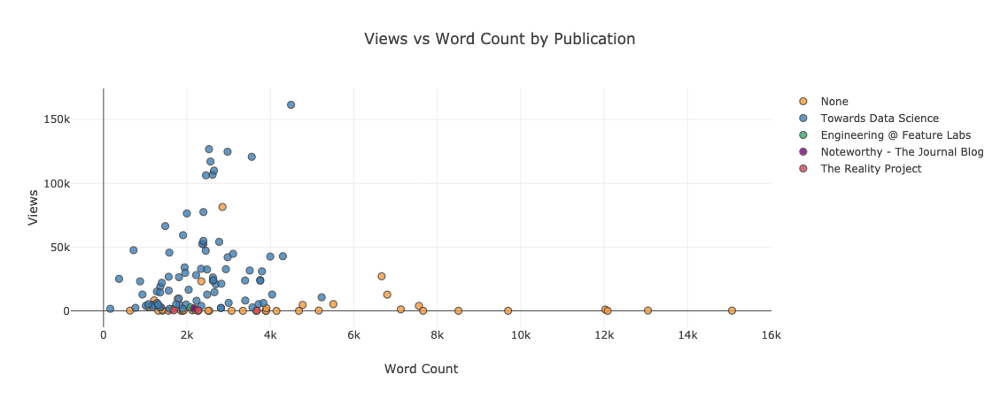

In [36]:
df.iplot(
    x='word_count',
    y='views',
    categories='publication',
    mode='markers',
    text='title',
    size=8,
    layout=dict(
        xaxis=dict(title='Word Count'),
        yaxis=dict(title='Views'),
        title='Views vs Word Count by Publication'))

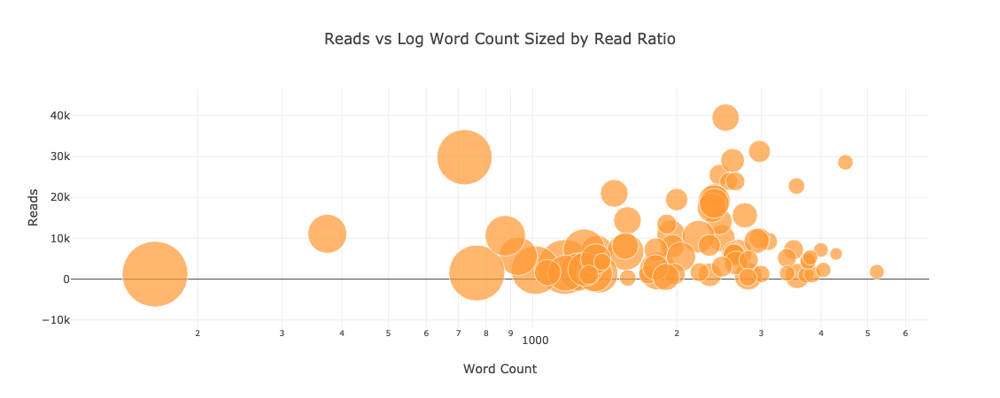

In [37]:
# three numeric variables
text = [
    f'Title: {t} <br> Ratio: {r:.2f}%'
    for t, r in zip(tds['title'], tds['read_ratio'])
]

tds.iplot(
    x='word_count',
    y='reads',
    opacity=0.8,
    size=tds['read_ratio'],
    text=text,
    mode='markers',
    theme='pearl',
    layout=dict(
        xaxis=dict(type='log', title='Word Count'),
        yaxis=dict(title='Reads'),
        title='Reads vs Log Word Count Sized by Read Ratio'))


#### Four Variables

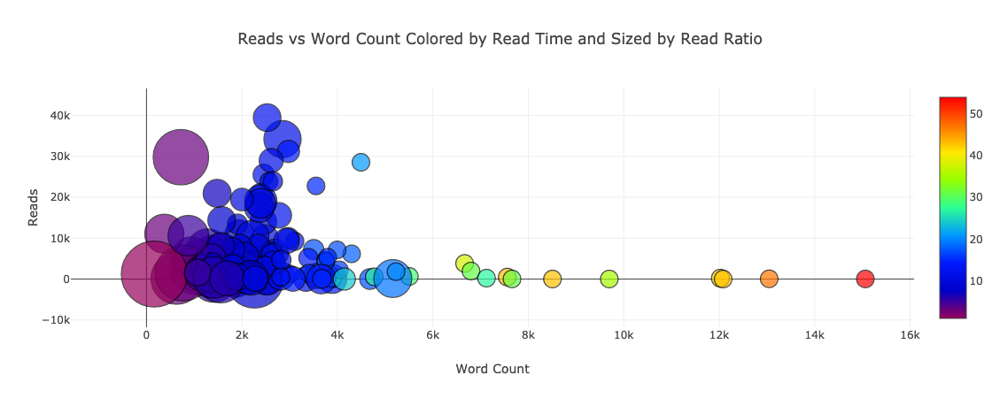

In [38]:
data = [
    go.Scatter(
        x=df['word_count'],
        y=df['reads'],
        text=df['title'],
        mode='markers',
        marker=dict(
            sizemin=10,
            size=df['read_ratio'],
            colorscale='Rainbow',
            showscale=True,
            color=df['read_time'],
            line=dict(color='black', width=1.2)))
]

figure = go.Figure(
    data=data,
    layout=go.Layout(
        xaxis=dict(title='Word Count'),
        yaxis=dict(title='Reads'),
        title='Reads vs Word Count Colored by Read Time and Sized by Read Ratio'
    ))

iplot(figure)

In [39]:
#### Five variables

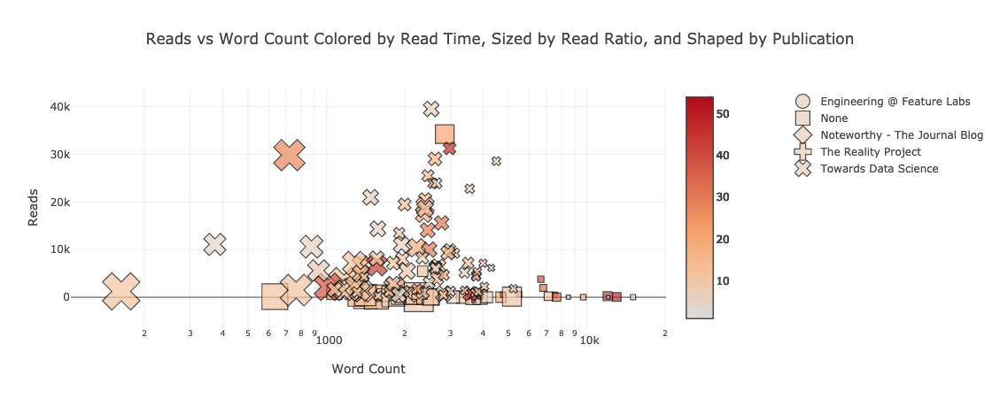

In [40]:
data = [
    go.Scatter(
        x=grouped['word_count'],
        y=grouped['reads'],
        text=grouped['title'],
        mode='markers',
        name=name,
        marker=dict(
            symbol=i,
            sizemin=2,
            sizeref=2,
            size=grouped['read_ratio'],
            colorscale='BlueRed',
            showscale=True,
            color=df['read_time'],
            line=dict(color='black', width=1.2)))
    for i, (name, grouped) in enumerate(df.groupby('publication'))
]

figure = go.Figure(
    data=data,
    layout=go.Layout(
        legend=dict(x=1.2),
        width=1000,
        margin=dict(r=20),
        xaxis=dict(type='log', title='Word Count'),
        yaxis=dict(title='Reads'),
        title='Reads vs Word Count Colored by Read Time, Sized by Read Ratio, and Shaped by Publication'
    ))

iplot(figure)

#### Limiting range and adding lines to plot

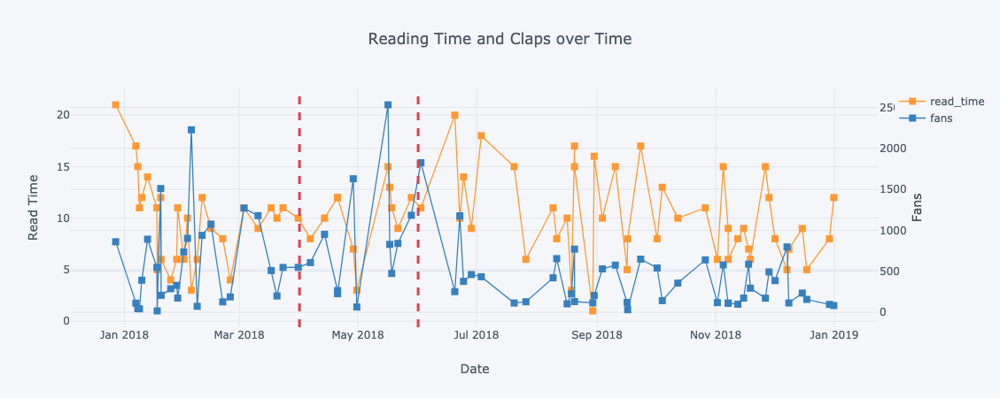

In [43]:

tds[['read_time', 'fans', 'title']].iplot(
    y='read_time',
    mode='lines+markers',
    secondary_y = 'fans',
    secondary_y_title='Fans',
    vline=[dict(x=pd.to_datetime('2018-04-01'), color='red', dash='dash', width=3),
            dict(x=pd.to_datetime('2018-06-01'), color='red', dash='dash', width=3),],
    opacity=0.8,
    size=8,
    symbol=1,
    xTitle='Date',
    yTitle='Read Time',
    text='title',
    title='Reading Time and Claps over Time')

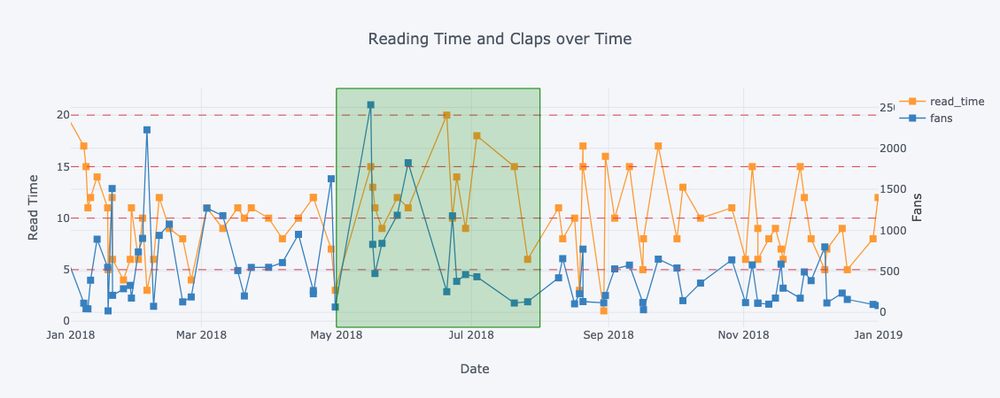

In [44]:
tds[['read_time', 'fans', 'title']].iplot(
    y='read_time',
    mode='lines+markers',
    secondary_y = 'fans',
    secondary_y_title='Fans',
    vspan=[dict(x0='2018-05-01', 
                x1='2018-08-01',
                color='green', fill='green', 
                opacity=0.2)],
    hline=[dict(y=i, color='red', dash='dash', width=1) for i in [5, 10, 15, 20]],
    xrange=('2018-01-01', '2019-01-01'),
    opacity=0.8,
    size=8,
    symbol=1,
    xTitle='Date',
    yTitle='Read Time',
    text='title',
    title='Reading Time and Claps over Time')

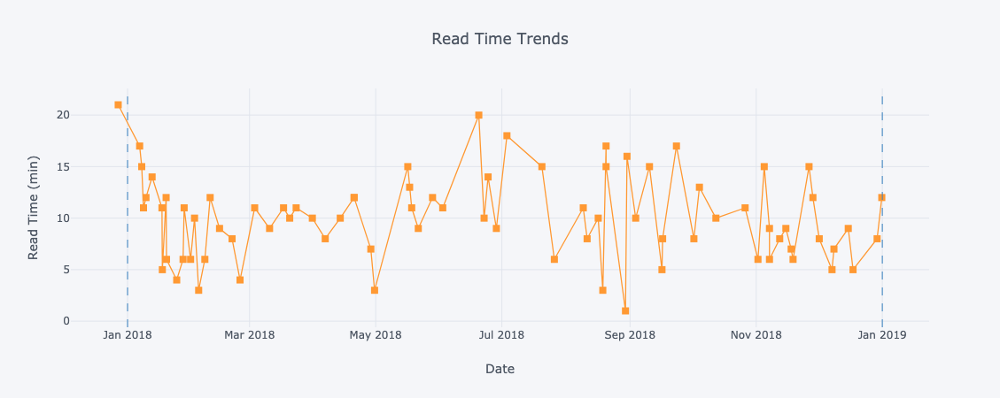

In [45]:
tds['read_time'].iplot(
    mode='lines+markers',
    vline=[dict(x=pd.to_datetime('2018-01-01'), color='blue', dash='dash'),
            dict(x=pd.to_datetime('2019-01-01'), color='blue', dash='dash'),],
    opacity=0.8,
    size=8,
    symbol=1,
    xTitle='Date',
    yTitle='Read Time (min)',
    title='Read Time Trends')

### Scatter Matrix
When we want to explore relationships among many variables, a scattermatrix (also called a splom) is a great option.

Use the plotly figure_factory, to keep even these incredible plots to one line.

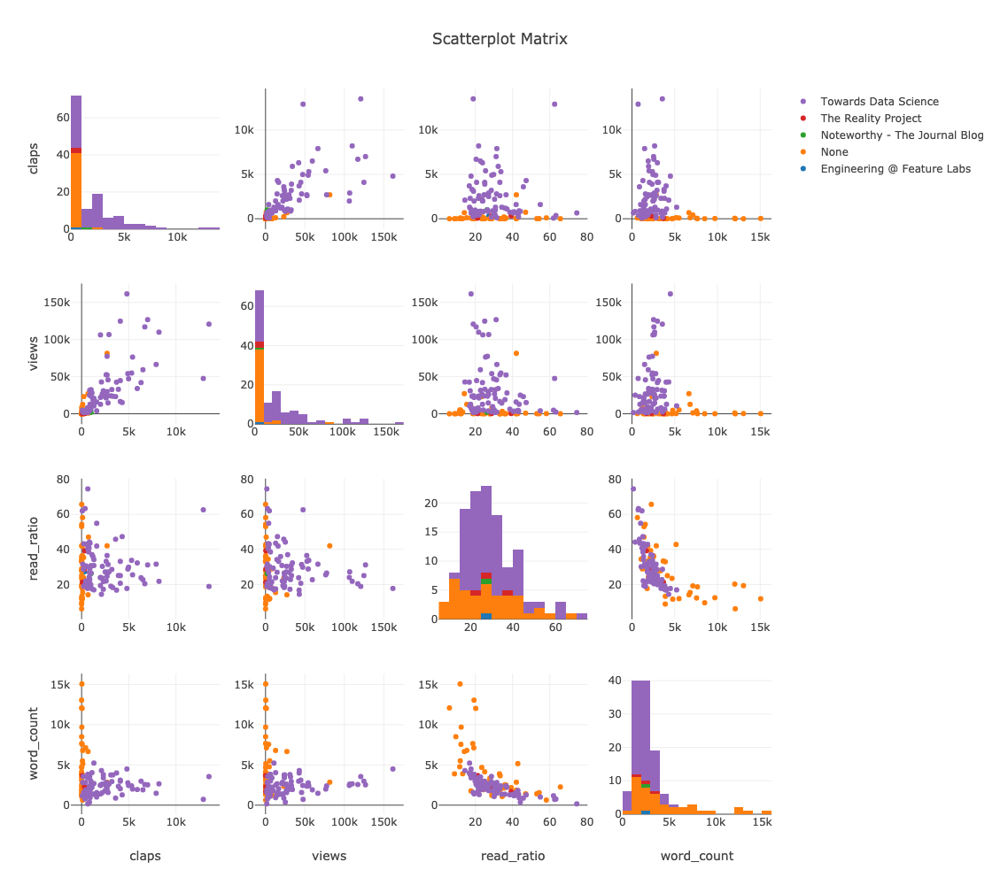

In [46]:
colorscales = [
    'Greys', 'YlGnBu', 'Greens', 'YlOrRd', 'Bluered', 'RdBu', 'Reds', 'Blues',
    'Picnic', 'Rainbow', 'Portland', 'Jet', 'Hot', 'Blackbody', 'Earth',
    'Electric', 'Viridis', 'Cividis'
]
import plotly.figure_factory as ff

figure = ff.create_scatterplotmatrix(
    df[['claps', 'publication', 'views', 'read_ratio', 'word_count']],
    height=1000,
    width=1000,
    text=df['title'],
    diag='histogram',
    index='publication')
iplot(figure)

### Heat Map

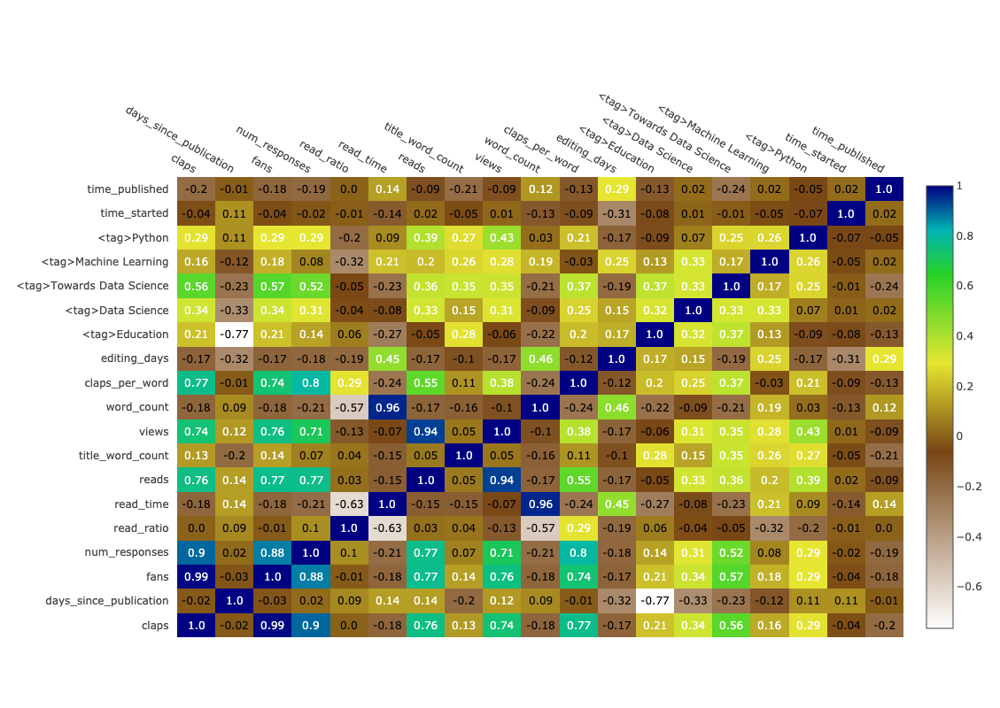

In [47]:
colorscales = [
    'Greys', 'YlGnBu', 'Greens', 'YlOrRd', 'Bluered', 'RdBu', 'Reds', 'Blues',
    'Picnic', 'Rainbow', 'Portland', 'Jet', 'Hot', 'Blackbody', 'Earth',
    'Electric', 'Viridis', 'Cividis'
]
corrs = df.corr()

figure = ff.create_annotated_heatmap(
    z=corrs.values,
    x=list(corrs.columns),
    y=list(corrs.index),
    colorscale='Earth',
    annotation_text=corrs.round(2).values,
    showscale=True, reversescale=True)

figure.layout.margin = dict(l=200, t=200)
figure.layout.height = 800
figure.layout.width = 1000

iplot(figure)


### Spread

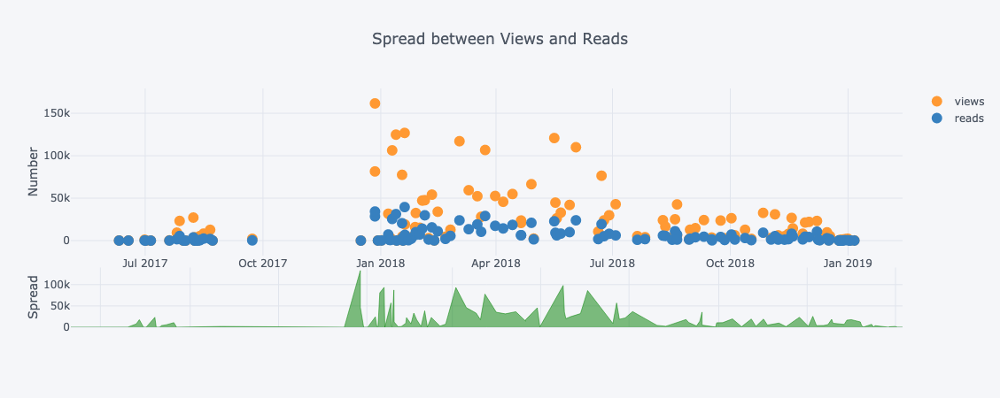

In [49]:
df.set_index('published_date')[['views', 'reads']].iplot(
    kind='spread', mode='markers', yTitle='Number', title='Spread between Views and Reads')

### Piecharts


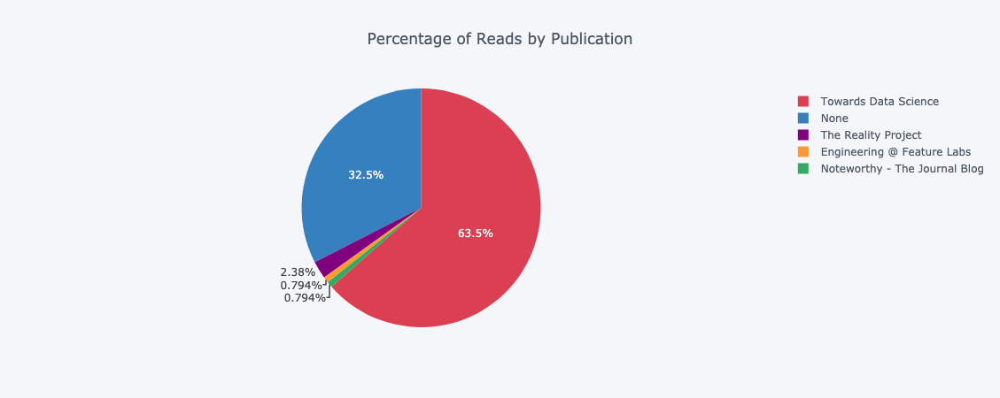

In [53]:
df.groupby(
    'publication', as_index=False)['reads'].count().iplot(
        kind='pie', labels='publication', values='reads', title='Percentage of Reads by Publication')

### 3D

#### 3D Surface plot

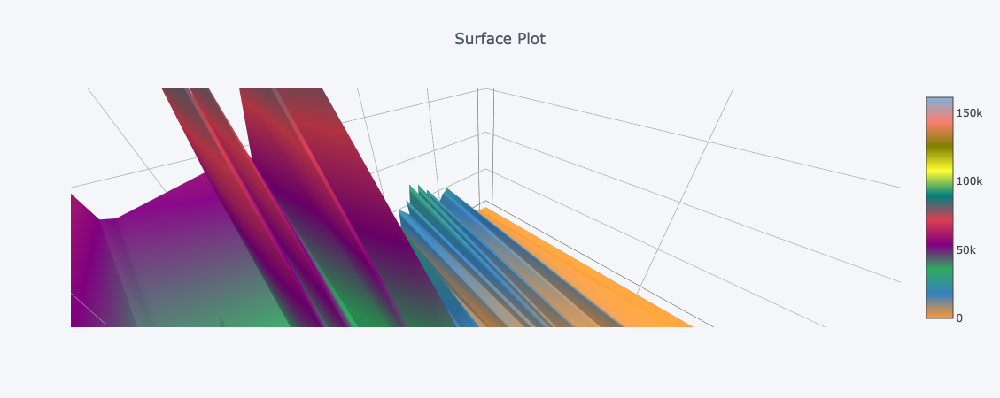

In [55]:
df[['views', 'reads', 'read_ratio']].iplot(
    kind='surface', title='Surface Plot')

#### 3D Scatter Plot

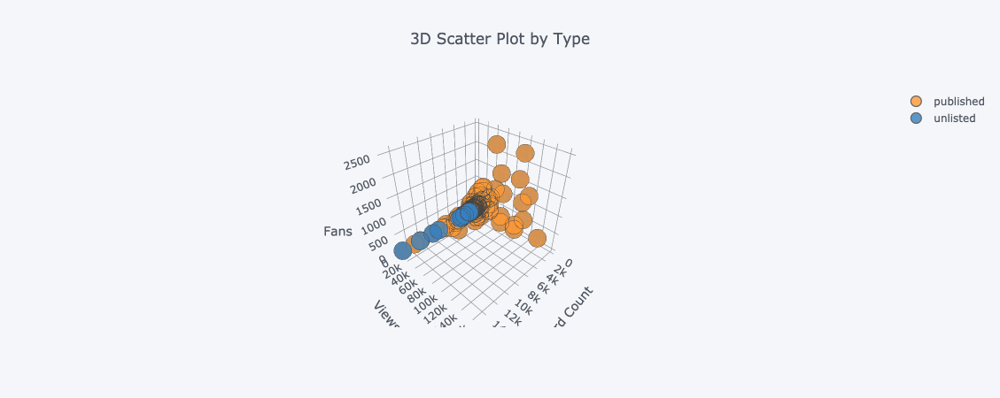

In [56]:
df.iplot(x='word_count', y='views', z='fans', kind='scatter3d', xTitle='Word Count', yTitle='Views',
         zTitle='Fans', theme='pearl',
         categories='type', title='3D Scatter Plot by Type')

#### 3D Bubble chart

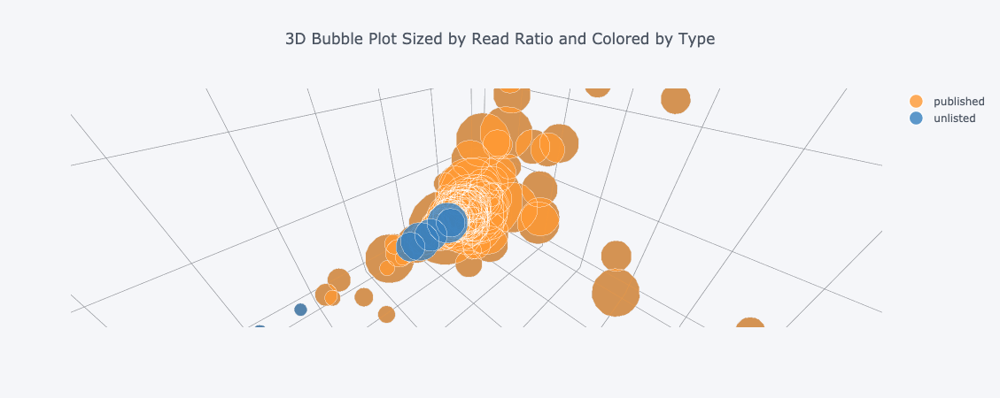

In [57]:
df.iplot(x='word_count', y='views', z='fans', kind='bubble3d', xTitle='Word Count', yTitle='Views',
         zTitle='Fans', theme='pearl', size='read_ratio',
         categories='type', title='3D Bubble Plot Sized by Read Ratio and Colored by Type')


### Themes
Cufflinks also has several themes we can use to get completely different styling with no effort.

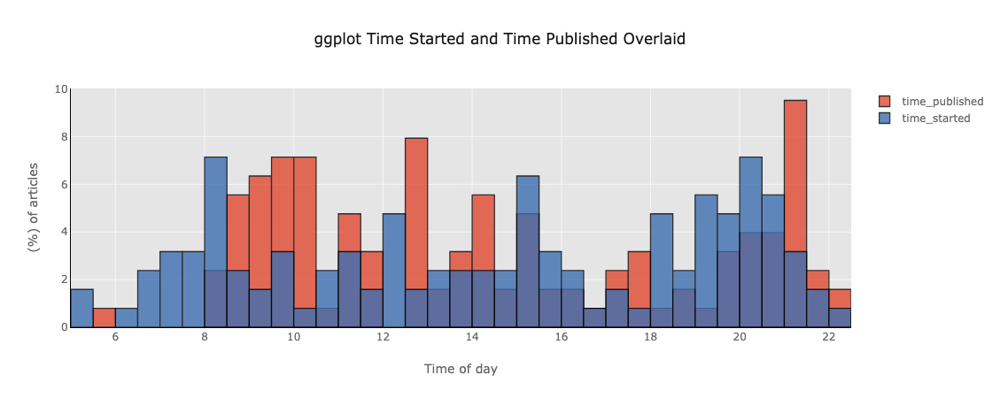

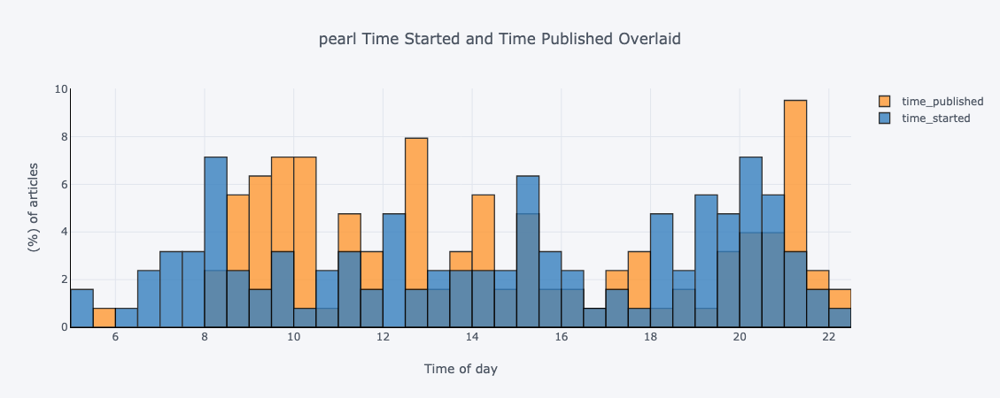

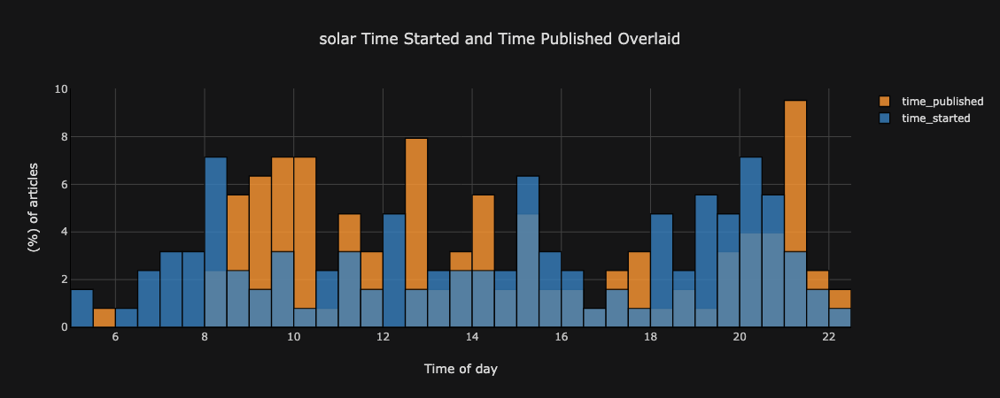

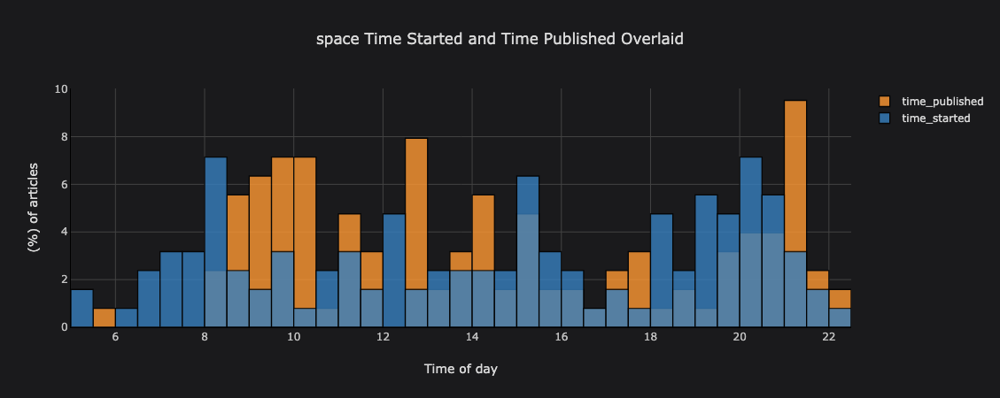

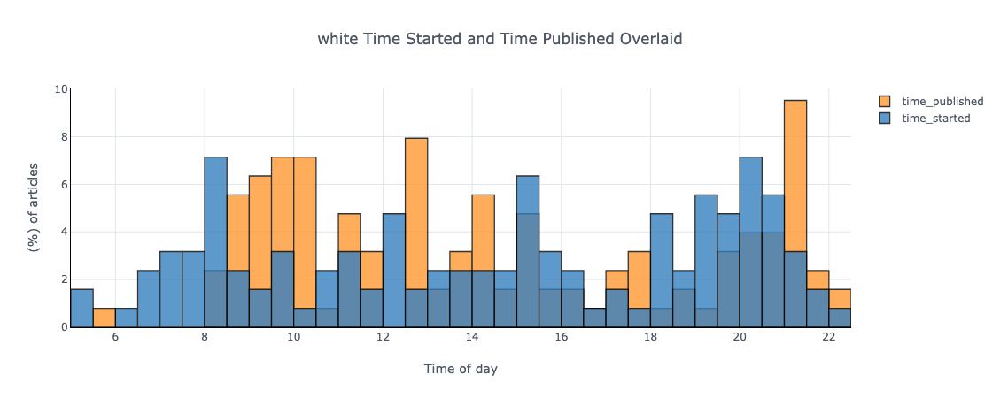

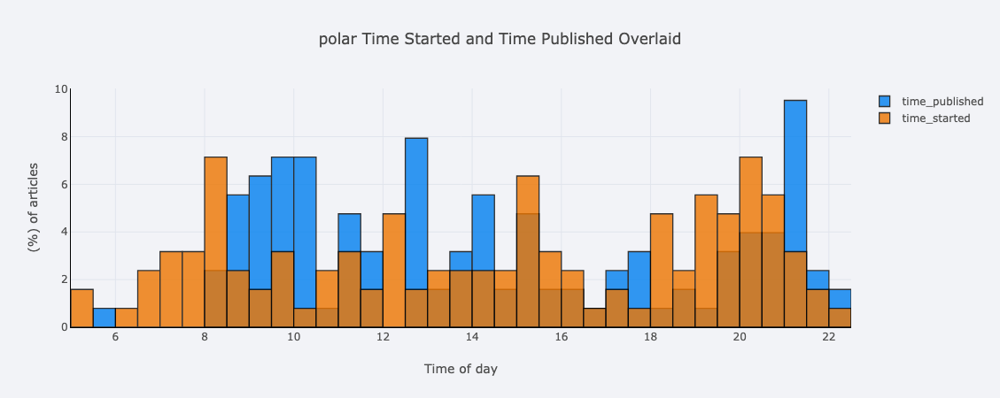

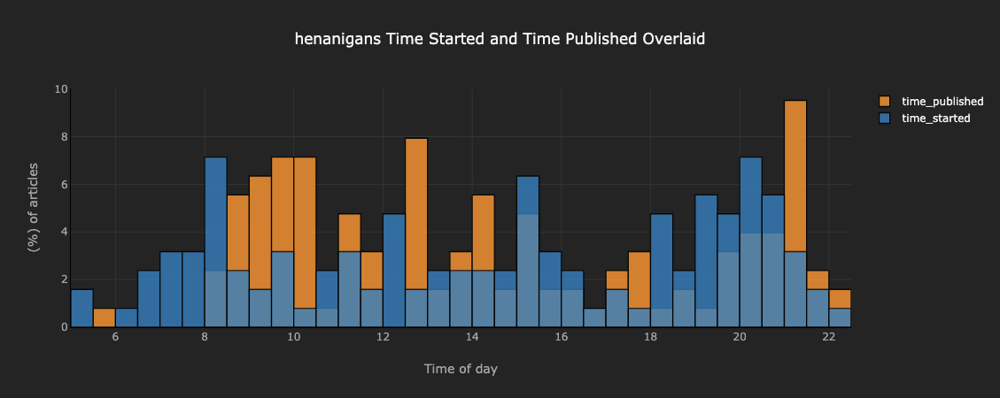

In [51]:
for t in themes:
    df[['time_published', 'time_started']].iplot(
    kind='hist',
    bins=48,
    linecolor='black',
    opacity=0.8,
    histnorm='percent',
    barmode='overlay',
    xTitle='Time of day',
    yTitle='(%) of articles',
        theme=t,
    title=f'{t} Time Started and Time Published Overlaid')

# Interactive Controls in Jupyter Notebooks
How to interactive controls to change inputs without needing to rewrite or rerun code.

Prerequisites (Jupyterlab):

```bash
jupyter nbextension enable --py widgetsnbextension
jupyter labextension install @jupyter-widgets/jupyterlab-manager
```

in notebook:

```python
import ipywidgets as widgets
from ipywidgets import interact, interact_manual
```

In [2]:
# Standard Data Science Helpers
import numpy as np
import pandas as pd
import scipy

import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode(connected=True)

import cufflinks as cf
cf.go_offline(connected=True)
cf.set_config_file(colorscale='plotly', world_readable=True)

# Extra options
pd.options.display.max_rows = 30
pd.options.display.max_columns = 25

# Show all code cells outputs
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

import os
from IPython.display import Image, display, HTML

In [3]:
# same data as used in part one
df = pd.read_parquet('https://github.com/WillKoehrsen/Data-Analysis/blob/master/medium/data/medium_data_2019_01_26?raw=true')
df.head()

,claps,days_since_publication,fans,link,num_responses,publication,published_date,read_ratio,read_time,reads,started_date,tags,text,title,title_word_count,type,views,word_count,claps_per_word,editing_days,<tag>Education,<tag>Data Science,<tag>Towards Data Science,<tag>Machine Learning,<tag>Python
129,2,597.301123,2,https://medium.com/p/screw-the-environment-but...,0,None,2017-06-10 14:25:00,42.17,7,70,2017-06-10 14:24:00,"[Climate Change, Economics]","Screw the Environment, but Consider Your Walle...","Screw the Environment, but Consider Your Wallet",8,published,166,1859,0.001076,0,0,0,0,0,0
125,18,589.983168,3,https://medium.com/p/the-vanquishing-of-war-pl...,0,None,2017-06-17 22:02:00,30.34,14,54,2017-06-17 22:02:00,"[Climate Change, Humanity, Optimism, History]","The Vanquishing of War, Plague and Famine Part...","The Vanquishing of War, Plague and Famine",8,published,178,3891,0.004626,0,0,0,0,0,0
132,51,577.363292,20,https://medium.com/p/capstone-project-mercedes...,0,None,2017-06-30 12:55:00,20.02,42,222,2017-06-30 12:00:00,"[Machine Learning, Python, Udacity, Kaggle]",Capstone Project: Mercedes-Benz Greener Manufa...,Capstone Project: Mercedes-Benz Greener Manufa...,7,published,1109,12025,0.004241,0,0,0,0,1,1
126,0,576.520688,0,https://medium.com/p/home-of-the-scared-5af0fe...,0,None,2017-07-01 09:08:00,35.85,9,19,2017-06-30 18:21:00,"[Politics, Books, News, Media Criticism]",Home of the Scared A review of A Culture of Fe...,Home of the Scared,4,published,53,2533,0.000000,0,0,0,0,0,0
121,0,572.533035,0,https://medium.com/p/the-triumph-of-peace-f485...,0,None,2017-07-05 08:51:00,8.47,14,5,2017-07-03 20:18:00,"[Books, Psychology, History, Humanism]",The Triumph of Peace A review of The Better An...,The Triumph of Peace,4,published,59,3892,0.000000,1,0,0,0,0,0


## Simple widget
The interact decorator automatically inferred we want a text box for the column and an int slider for x! This makes it incredibly simple to add interactivity. We can also set the options how we want.

In [4]:
import ipywidgets as widgets
from ipywidgets import interact, interact_manual
@interact
def show_articles_more_than(column='claps', x=5000):
    display(HTML(f'<h2>Showing articles with more than {x} {column}<h2>'))
    display(df.loc[df[column] > x, ['title', 'published_date', 'read_time', 'tags', 'views', 'reads']])


interactive(children=(Text(value='claps', description='column'), IntSlider(value=5000, description='x', max=15…

In [5]:
@interact
def show_titles_more_than(x=(1000, 5000, 100),
                          column=list(df.select_dtypes('number').columns), 
                          ):
    # display(HTML(f'<h2>Showing articles with more than {x} {column}<h2>'))
    display(df.loc[df[column] > x, ['title', 'published_date', 'read_time', 'tags', 'views', 'reads']])

interactive(children=(IntSlider(value=3000, description='x', max=5000, min=1000, step=100), Dropdown(descripti…

## File Browser and Image explorer
Display images from a folder or get detailed file informations like `!ls -a -t -r -l`.

In [7]:
fdir = 'img/'

@interact
def show_images(file=os.listdir(fdir)):
    display(Image(fdir+file))


interactive(children=(Dropdown(description='file', options=('Screen Shot 2018-12-31 at 3.32.35 PM.png', 'Scree…

In [8]:
import subprocess
import pprint

root_dir = '../'
dirs = [d for d in os.listdir(root_dir) if not '.' in d]

@interact
def show_dir(dir=dirs):
    x = subprocess.check_output(f"cd {root_dir}{dir} && ls -a -t -r -l -h", shell=True).decode()
    print(x)
    

interactive(children=(Dropdown(description='dir', options=('edu', 'visualization', 'graphs-networkx', 'bokeh',…

In [21]:
# use observer 
directory = widgets.Dropdown(options=['img', 'nature', 'assorted'])
images = widgets.Dropdown(options=os.listdir(directory.value))

def update_images(*args):
    images.options = os.listdir(directory.value)

directory.observe(update_images, 'value')

def show_images(fdir, file):
    display(Image(f'{fdir}/{file}'))

_ = interact(show_images, fdir=directory, file=images)

interactive(children=(Dropdown(description='fdir', options=('img', 'nature', 'assorted'), value='img'), Dropdo…

In [19]:
def show_stats_by_tag(tag):
    display(df.groupby(f'<tag>{tag}').describe()[['views', 'reads', 'claps', 'read_ratio']])
    
stats = interact(show_stats_by_tag,
                tag=widgets.Dropdown(options=['Towards Data Science', 'Education', 'Machine Learning', 'Python', 'Data Science']))

interactive(children=(Dropdown(description='tag', options=('Towards Data Science', 'Education', 'Machine Learn…

In [ ]:
stats.widget

## Data Frame explorer
Let's look at a few more examples of using widgets to explore data. Here we create a widget that quickly lets us find correlations between columns.

In [9]:
@interact
def correlations(column1=list(df.select_dtypes('number').columns), 
                 column2=list(df.select_dtypes('number').columns)):
    print(f"Correlation: {df[column1].corr(df[column2])}")

interactive(children=(Dropdown(description='column1', options=('claps', 'days_since_publication', 'fans', 'num…

## Selecting data for plots
We can use the same @interact decorator with functions that visualize our data. 

In [10]:
import cufflinks as cf

@interact
def scatter_plot(x=list(df.select_dtypes('number').columns), 
                 y=list(df.select_dtypes('number').columns)[1:],
                 theme=list(cf.themes.THEMES.keys()), 
                 colorscale=list(cf.colors._scales_names.keys())):
    
    df.iplot(kind='scatter', x=x, y=y, mode='markers', 
             xTitle=x.title(), yTitle=y.title(), 
             text='title',
             title=f'{y.title()} vs {x.title()}',
            theme=theme, colorscale=colorscale)

interactive(children=(Dropdown(description='x', options=('claps', 'days_since_publication', 'fans', 'num_respo…

In [14]:
# The next plot lets us choose the grouping category for the plot.
df['binned_read_time'] = pd.cut(df['read_time'], bins=range(0, 56, 5))
df['binned_read_time'] = df['binned_read_time'].astype(str)

df['binned_word_count'] = pd.cut(df['word_count'], bins=range(0, 100001, 1000))
df['binned_word_count'] = df['binned_word_count'].astype(str)

@interact
def scatter_plot(x=list(df.select_dtypes('number').columns), 
                 y=list(df.select_dtypes('number').columns)[1:],
                 categories=['binned_read_time', 'binned_word_count', 'publication', 'type'],
                 theme=list(cf.themes.THEMES.keys()), 
                 colorscale=list(cf.colors._scales_names.keys())):
    
    df.iplot(kind='scatter', x=x, y=y, mode='markers', 
             categories=categories, 
             xTitle=x.title(), yTitle=y.title(), 
             text='title',
             title=f'{y.title()} vs {x.title()}',
             theme=theme, colorscale=colorscale)

interactive(children=(Dropdown(description='x', options=('claps', 'days_since_publication', 'fans', 'num_respo…

In [15]:
# interact_manual which only updates the function when the button is pressed.
from ipywidgets import interact_manual
@interact_manual
def scatter_plot(x=list(df.select_dtypes('number').columns), 
                 y=list(df.select_dtypes('number').columns)[1:],
                 categories=['binned_read_time', 'binned_word_count', 'publication', 'type'],
                 theme=list(cf.themes.THEMES.keys()), 
                 colorscale=list(cf.colors._scales_names.keys())):
    
    df.iplot(kind='scatter', x=x, y=y, mode='markers', 
             categories=categories, 
             xTitle=x.title(), yTitle=y.title(), 
             text='title',
             title=f'{y.title()} vs {x.title()}',
             theme=theme, colorscale=colorscale)

interactive(children=(Dropdown(description='x', options=('claps', 'days_since_publication', 'fans', 'num_respo…

## Creating own decorators
To get more from the IPywidgets library, we can make the widgets ourselves and use them int the interact function. For instance DatePicker. Set a start and end date and prints stats for all the articles published between them. 

In [16]:
df.set_index('published_date', inplace=True)

In [17]:
def print_articles_published(start_date, end_date):
    start_date = pd.Timestamp(start_date)
    end_date = pd.Timestamp(end_date)
    stat_df = df.loc[(df.index >= start_date) & (df.index <= end_date)].copy()
    total_words = stat_df['word_count'].sum()
    total_read_time = stat_df['read_time'].sum()
    num_articles = len(stat_df)
    print(f'You published {num_articles} articles between {start_date.date()} and {end_date.date()}.')
    print(f'These articles totalled {total_words:,} words and {total_read_time/60:.2f} hours to read.')
    
_ = interact(print_articles_published,
             start_date=widgets.DatePicker(value=pd.to_datetime('2018-01-01')),
             end_date=widgets.DatePicker(value=pd.to_datetime('2019-01-01')))

interactive(children=(DatePicker(value=Timestamp('2018-01-01 00:00:00'), description='start_date'), DatePicker…

In [18]:
def plot_up_to(column, date):
    date = pd.Timestamp(date)
    plot_df = df.loc[df.index <= date].copy()
    plot_df[column].cumsum().iplot(mode='markers+lines', 
                                   xTitle='published date',
                                   yTitle=column, 
                                  title=f'Cumulative {column.title()} Until {date.date()}')
    
_ = interact(plot_up_to, column=widgets.Dropdown(options=list(df.select_dtypes('number').columns)), 
             date = widgets.DatePicker(value=pd.to_datetime('2019-01-01')))

interactive(children=(Dropdown(description='column', options=('claps', 'days_since_publication', 'fans', 'num_…

## Linked Values

We can link the value of two widgets to each other using the `jslink` function. This ties the values to be the same.

In [22]:
def show_less_than(column1_value, column2_value):
    display(df.loc[(df['views'] < column1_value) & 
                    (df['reads'] < column2_value), 
                   ['title', 'read_time', 'tags', 'views', 'reads']])
        
column1_value=widgets.IntText(value=100, label='First')
column2_value=widgets.IntSlider(value=100, label='Second')

linked = widgets.jslink((column1_value, 'value'),
                        (column2_value, 'value'))

less_than = interact(show_less_than, column1_value=column1_value,
                 column2_value=column2_value)

interactive(children=(IntText(value=100, description='column1_value'), IntSlider(value=100, description='colum…

In [23]:
linked.unlink()

In [24]:
less_than.widget

interactive(children=(IntText(value=100, description='column1_value'), IntSlider(value=100, description='colum…

In [25]:
cscales = ['Greys', 'YlGnBu', 'Greens', 'YlOrRd', 'Bluered', 'RdBu',
            'Reds', 'Blues', 'Picnic', 'Rainbow', 'Portland', 'Jet',
            'Hot', 'Blackbody', 'Earth', 'Electric', 'Viridis', 'Cividis']

In [26]:
import plotly.figure_factory as ff

corrs = df.corr()

@interact_manual
def plot_corrs(colorscale=cscales):
    figure = ff.create_annotated_heatmap(z = corrs.round(2).values, 
                                     x =list(corrs.columns), 
                                     y=list(corrs.index), 
                                     colorscale=colorscale,
                                     annotation_text=corrs.round(2).values)
    iplot(figure)

interactive(children=(Dropdown(description='colorscale', options=('Greys', 'YlGnBu', 'Greens', 'YlOrRd', 'Blue…

In [27]:
@interact
def plot_spread(column1=['claps', 'views', 'read', 'word_count'], 
                 column2=['views', 'claps', 'read', 'word_count']):
    df.iplot(kind='ratio',
                                                   y=column1,
                                                   secondary_y=column2,
                                                   title=f'{column1.title()} and {column2.title()} Spread Plot',
                                 xTitle='Published Date')

interactive(children=(Dropdown(description='column1', options=('claps', 'views', 'read', 'word_count'), value=…